In [1]:
import tensorflow as tf
import numpy as np
import os
import time
from tqdm.auto import tqdm

from matplotlib import pyplot as plt


In [2]:
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [3]:
def load_input(image_number):
  input_image = tf.io.read_file("./data/castex/train/castex" + str(image_number) + ".jpeg")
  input_image = tf.image.decode_jpeg(input_image)
  input_image = tf.cast(input_image, tf.float32)


  return input_image

def load_target(image_number):
  input_image = tf.io.read_file("./data/macron/train/macron" + str(image_number) + ".jpeg")
  input_image = tf.image.decode_jpeg(input_image)
  input_image = tf.cast(input_image, tf.float32)


  return input_image

def load_input_test(image_number):
  input_image = tf.io.read_file("./data/castex/test/castex" + str(image_number) + ".jpeg")
  input_image = tf.image.decode_jpeg(input_image)
  input_image = tf.cast(input_image, tf.float32)


  return input_image

def load_target_test(image_number):
  input_image = tf.io.read_file("./data/macron/test/macron" + str(image_number) + ".jpeg")
  input_image = tf.image.decode_jpeg(input_image)
  input_image = tf.cast(input_image, tf.float32)


  return input_image

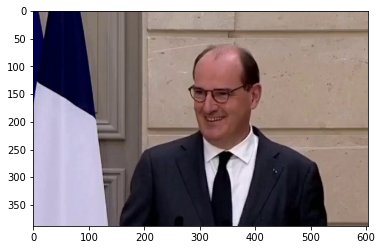

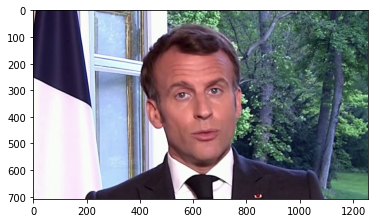

In [4]:
inp= load_input(1)
re = load_target(1)
# casting to int for matplotlib to show the image
plt.figure()
plt.imshow(inp/255.0)
plt.figure()
plt.imshow(re/255.0)

In [5]:
def resize(input_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image

In [6]:
# normalizing the images to [-1, 1]

def normalize(image):
  image = (image / 127.5) - 1

  return image

In [7]:
def load_image_input(image_file):
  input_image = load_input(image_file)
  input_image = resize(input_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image = normalize(input_image)

  return input_image

def load_image_target(image_file):
  input_image = load_target(image_file)
  input_image = resize(input_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image = normalize(input_image)

  return input_image

def load_image_input_test(image_file):
  input_image = load_input_test(image_file)
  input_image = resize(input_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image = normalize(input_image)

  return input_image

def load_image_target_test(image_file):
  input_image = load_target_test(image_file)
  input_image = resize(input_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image = normalize(input_image)

  return input_image

In [8]:
load_image_input(0)

<tf.Tensor: shape=(256, 256, 3), dtype=float32, numpy=
array([[[-1.        , -0.99215686, -0.36470586],
        [-0.9843137 , -0.99215686, -0.3960784 ],
        [-0.9607843 , -0.99215686, -0.38823527],
        ...,
        [ 0.34901965,  0.20784318,  0.09803927],
        [ 0.34901965,  0.20784318,  0.09803927],
        [ 0.36470592,  0.23921573,  0.13725495]],

       [[-1.        , -0.99215686, -0.3490196 ],
        [-0.9843137 , -0.99215686, -0.3960784 ],
        [-0.9607843 , -0.99215686, -0.3960784 ],
        ...,
        [ 0.3411765 ,  0.20000005,  0.09019613],
        [ 0.34901965,  0.20784318,  0.09803927],
        [ 0.35686278,  0.21568632,  0.10588241]],

       [[-1.        , -0.99215686, -0.3490196 ],
        [-0.9764706 , -1.        , -0.38039213],
        [-0.9607843 , -0.99215686, -0.3960784 ],
        ...,
        [ 0.3411765 ,  0.20000005,  0.09019613],
        [ 0.34901965,  0.20784318,  0.09803927],
        [ 0.35686278,  0.21568632,  0.10588241]],

       ...,

     

In [9]:
import random

train_dataset1 = []
train_dataset2 = []
train = []
for i in range(2000):
    train.append(i)
random.shuffle(train)
for i in tqdm(range(len(train))):
  y = train[i]
  train_dataset1.append(load_image_input(y))
  train_dataset2.append(load_image_target(y))

  0%|          | 0/2000 [00:00<?, ?it/s]

In [10]:
test_dataset1 = []
test_dataset2 = []
for i in tqdm(range(5000, 5100)):
    test_dataset1.append(load_image_input_test(i))
    test_dataset2.append(load_image_target_test(i))


  0%|          | 0/100 [00:00<?, ?it/s]

In [11]:
##Generator

OUTPUT_CHANNELS = 3

def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)


(1, 194, 302, 3)
(1, 388, 604, 3)


In [12]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 3])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (bs, 128, 128, 64)
    downsample(128, 4),  # (bs, 64, 64, 128)
    downsample(256, 4),  # (bs, 32, 32, 256)
    downsample(512, 4),  # (bs, 16, 16, 512)
    downsample(512, 4),  # (bs, 8, 8, 512)
    downsample(512, 4),  # (bs, 4, 4, 512)
    downsample(512, 4),  # (bs, 2, 2, 512)
    downsample(512, 4),  # (bs, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (bs, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (bs, 8, 8, 1024)
    upsample(512, 4),  # (bs, 16, 16, 1024)
    upsample(256, 4),  # (bs, 32, 32, 512)
    upsample(128, 4),  # (bs, 64, 64, 256)
    upsample(64, 4),  # (bs, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (bs, 256, 256, 3)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

In [13]:
generator = Generator()

In [14]:
## Genarator LOSS
LAMBDA = 100
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [15]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (bs, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

discriminator = Discriminator()

In [16]:
## Discriminator Loss
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [17]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [18]:
def createJpeg(tmpImg, name):
    tmpImg = tmpImg.numpy()
    tmpImg = (tmpImg +1)*127.5
    tmpImg = np.rint(tmpImg)
    tf_image = tf.image.encode_jpeg(tmpImg)
    tf.io.write_file(name, tf_image)


def generate_images(model, test_input, tar, i):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']
  path = "./imgResult/"
  name1 = path + title[0] + str(i) + ".jpeg"
  name2 = path + title[1] + str(i) + ".jpeg"
  name3 = path + title[2] + str(i) + ".jpeg"
  createJpeg(display_list[0], name1)
  createJpeg(display_list[1], name2)
  createJpeg(display_list[2], name3)

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [19]:
train_dataset1 = tf.convert_to_tensor(train_dataset1)
train_dataset2 = tf.convert_to_tensor(train_dataset2)
train_dataset1 = tf.expand_dims(train_dataset1, axis=1)
train_dataset2 = tf.expand_dims(train_dataset2, axis=1)

test_dataset1 = tf.convert_to_tensor(test_dataset1)
test_dataset2 = tf.convert_to_tensor(test_dataset2)
test_dataset1 = tf.expand_dims(test_dataset1, axis=1)
test_dataset2 = tf.expand_dims(test_dataset2, axis=1)
print(type(test_dataset1), tf.shape(test_dataset1))
print(type(train_dataset1), tf.shape(train_dataset1))

<class 'tensorflow.python.framework.ops.EagerTensor'> tf.Tensor([100   1 256 256   3], shape=(5,), dtype=int32)
<class 'tensorflow.python.framework.ops.EagerTensor'> tf.Tensor([2000    1  256  256    3], shape=(5,), dtype=int32)


In [20]:
print("")
#for example_input, example_target in zip(test_dataset1, test_dataset2):
#  generate_images(generator, example_input, example_target)

In [21]:
#Training

EPOCHS = 30
import datetime
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=epoch)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=epoch)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=epoch)
    tf.summary.scalar('disc_loss', disc_loss, step=epoch)


In [22]:

def fit(train_ds1, train_ds2, epochs, test_ds1, test_ds2):
  for epoch in range(epochs):
    start = time.time()

    rand = random.randint(0, len(test_ds1)-1)

    generate_images(generator, test_ds1[rand], test_ds2[rand], epoch)

    print("Epoch: ", epoch)


    # Train
    for n in tqdm(range(2000)):
      train_step(train_ds1[n], train_ds2[n], epoch)
    print()

    # saving (checkpoint) the model every 5 epochs
    if (epoch + 1) % 5 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

    print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
  checkpoint.save(file_prefix=checkpoint_prefix)

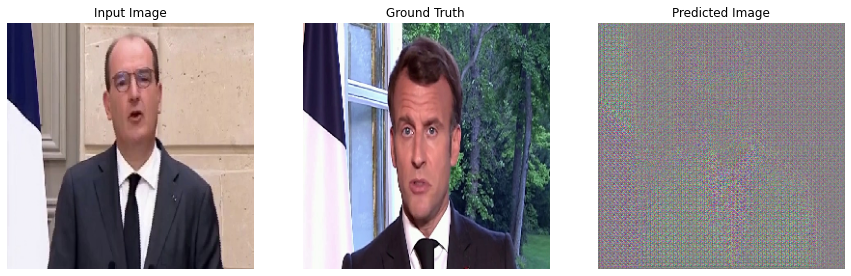

Epoch:  0

Time taken for epoch 1 is 144.4050145149231 sec

Epoch:  1

Time taken for epoch 2 is 142.1906967163086 sec

Epoch:  2

Time taken for epoch 3 is 142.29285407066345 sec

Epoch:  3

Time taken for epoch 4 is 142.79243659973145 sec

Epoch:  4

Time taken for epoch 5 is 150.23035669326782 sec

Epoch:  5

Time taken for epoch 6 is 144.27737092971802 sec

Epoch:  6

Time taken for epoch 7 is 144.75721406936646 sec

Epoch:  7

Time taken for epoch 8 is 144.35510540008545 sec

Epoch:  8

Time taken for epoch 9 is 144.51853680610657 sec

Epoch:  9

Time taken for epoch 10 is 150.07196021080017 sec

Epoch:  10

Time taken for epoch 11 is 146.57663011550903 sec

Epoch:  11

Time taken for epoch 12 is 148.15738487243652 sec

Epoch:  12

Time taken for epoch 13 is 145.82947707176208 sec

Epoch:  13

Time taken for epoch 14 is 144.37220096588135 sec

Epoch:  14

Time taken for epoch 15 is 149.8048975467682 sec

Epoch:  15

Time taken for epoch 16 is 144.32187008857727 sec

Epoch:  16

Ti

  0%|          | 0/2000 [00:00<?, ?it/s]

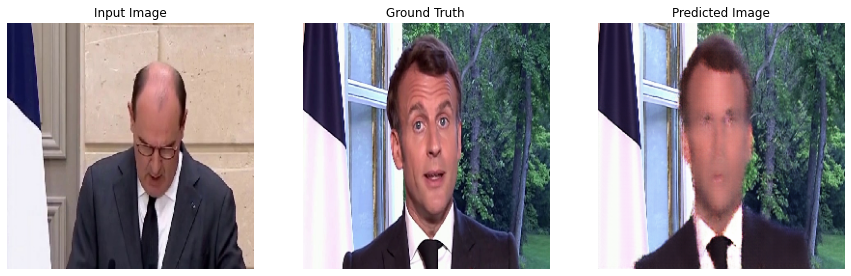

  0%|          | 0/2000 [00:00<?, ?it/s]

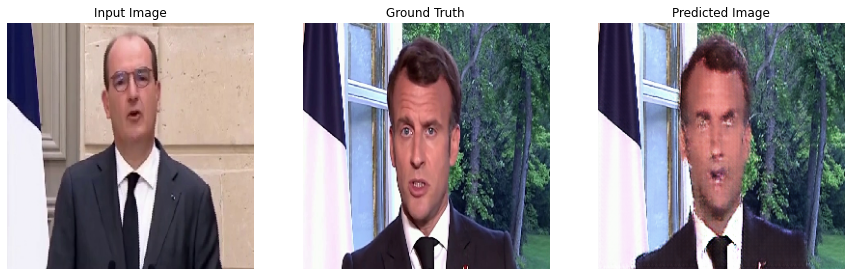

  0%|          | 0/2000 [00:00<?, ?it/s]

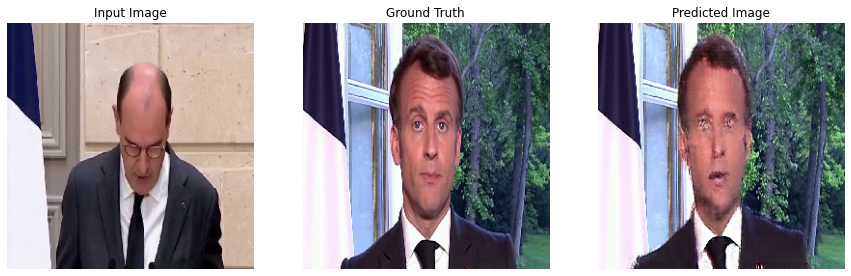

  0%|          | 0/2000 [00:00<?, ?it/s]

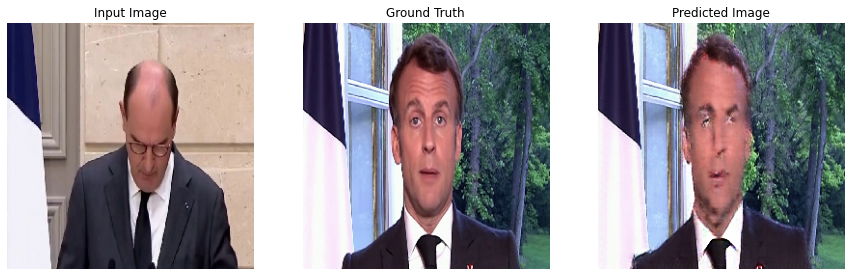

  0%|          | 0/2000 [00:00<?, ?it/s]

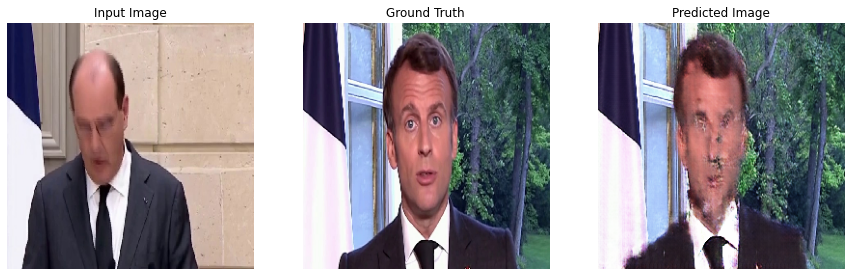

  0%|          | 0/2000 [00:00<?, ?it/s]

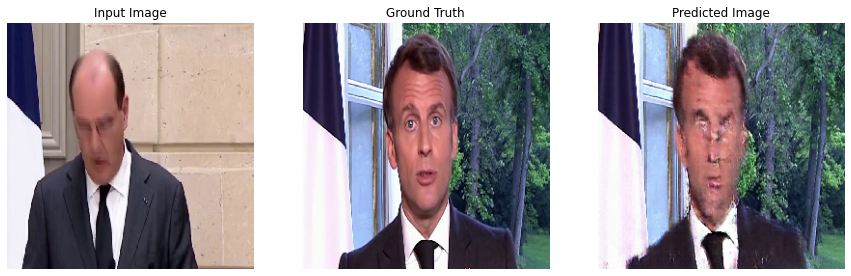

  0%|          | 0/2000 [00:00<?, ?it/s]

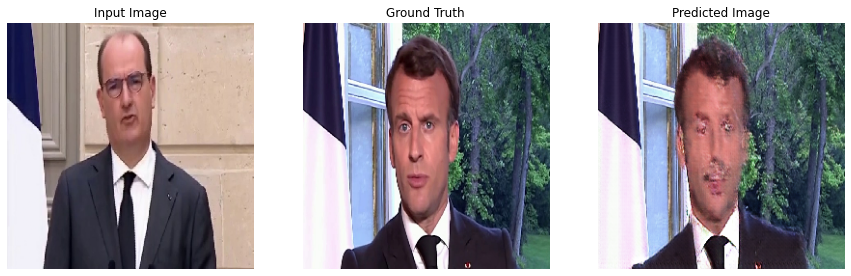

  0%|          | 0/2000 [00:00<?, ?it/s]

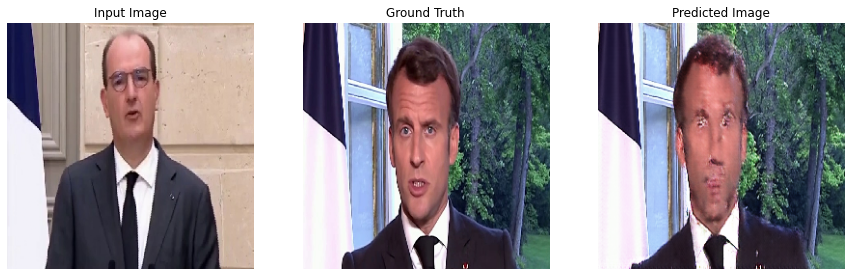

  0%|          | 0/2000 [00:00<?, ?it/s]

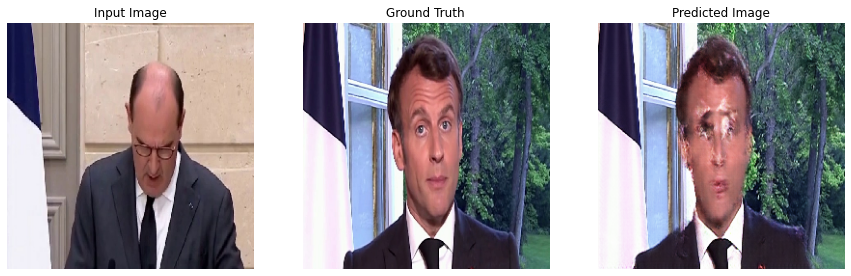

  0%|          | 0/2000 [00:00<?, ?it/s]

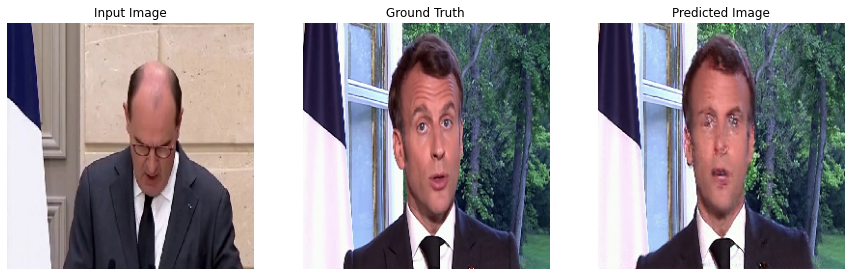

  0%|          | 0/2000 [00:00<?, ?it/s]

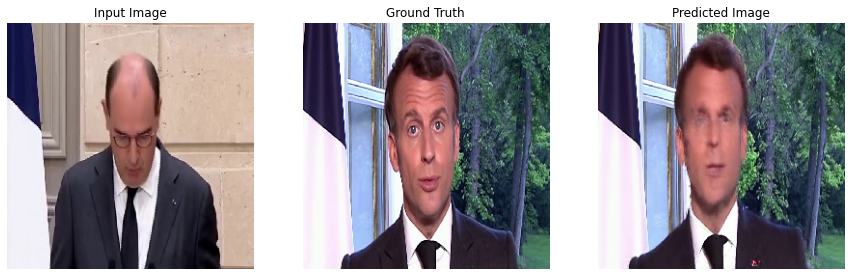

  0%|          | 0/2000 [00:00<?, ?it/s]

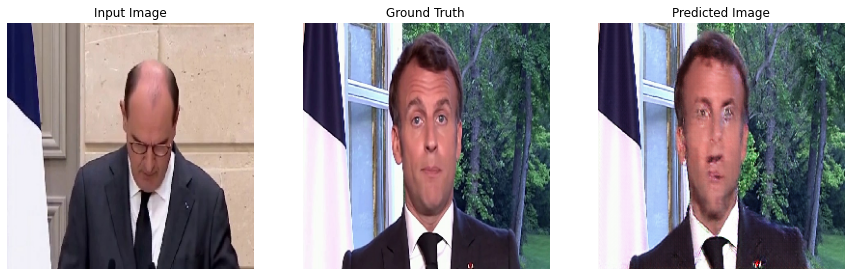

  0%|          | 0/2000 [00:00<?, ?it/s]

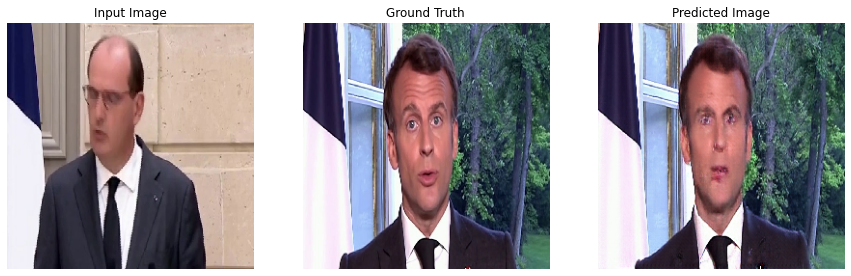

  0%|          | 0/2000 [00:00<?, ?it/s]

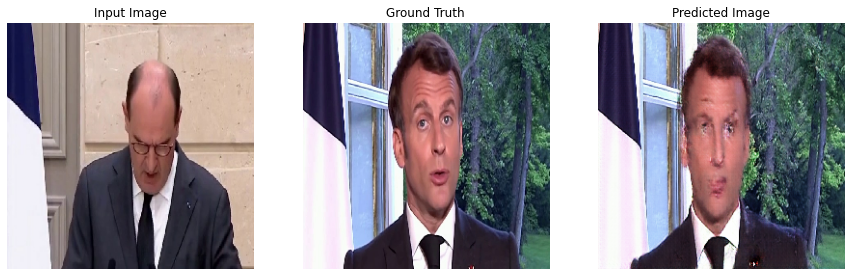

  0%|          | 0/2000 [00:00<?, ?it/s]

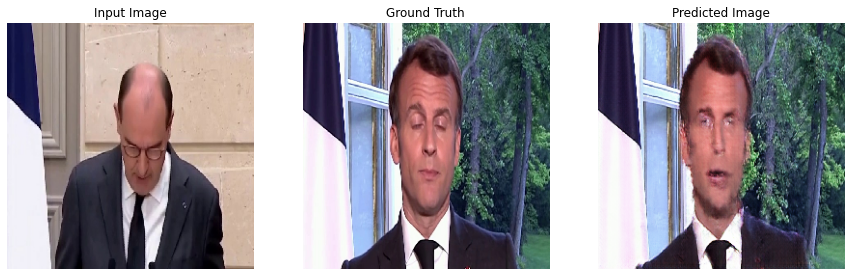

  0%|          | 0/2000 [00:00<?, ?it/s]

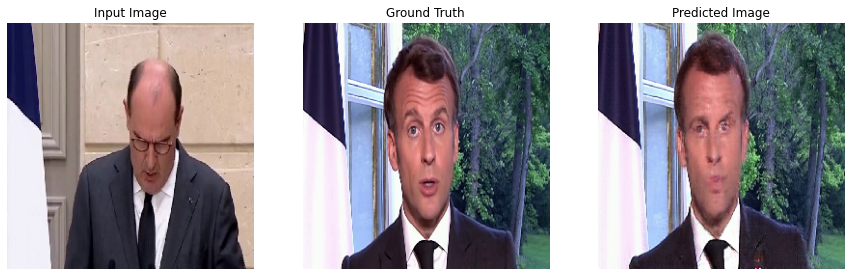

  0%|          | 0/2000 [00:00<?, ?it/s]

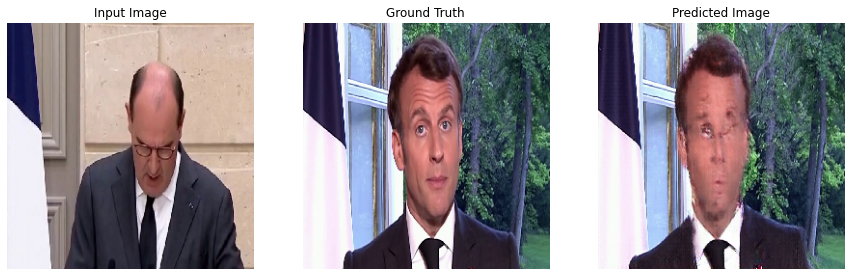

  0%|          | 0/2000 [00:00<?, ?it/s]

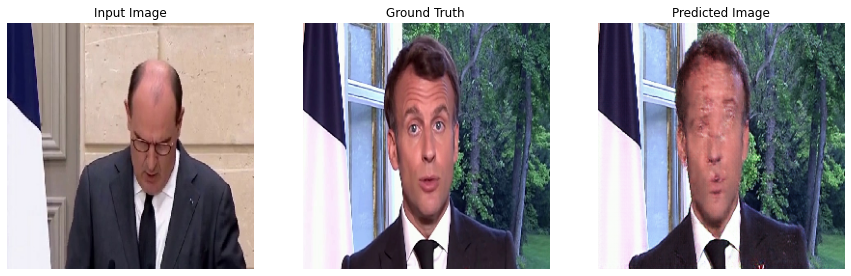

  0%|          | 0/2000 [00:00<?, ?it/s]

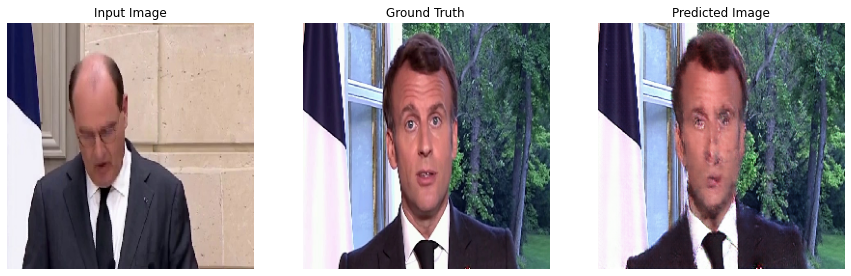

  0%|          | 0/2000 [00:00<?, ?it/s]

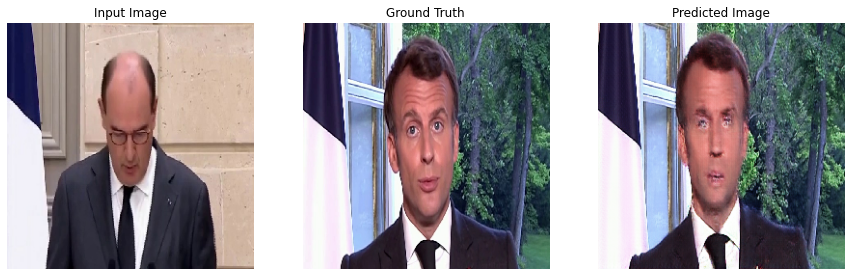

  0%|          | 0/2000 [00:00<?, ?it/s]

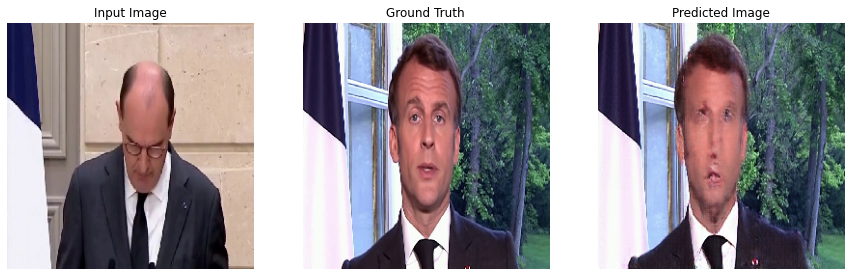

  0%|          | 0/2000 [00:00<?, ?it/s]

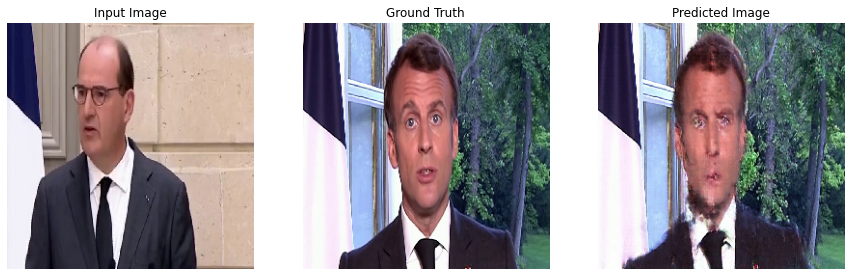

  0%|          | 0/2000 [00:00<?, ?it/s]

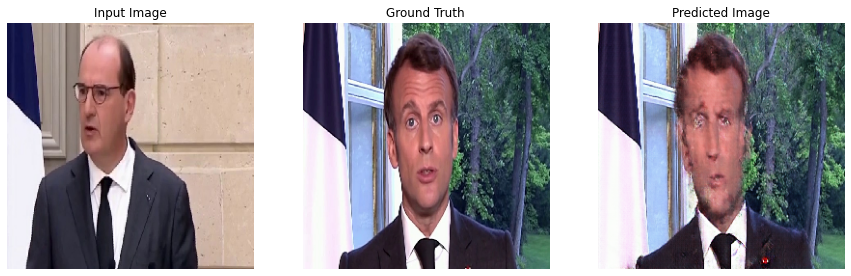

  0%|          | 0/2000 [00:00<?, ?it/s]

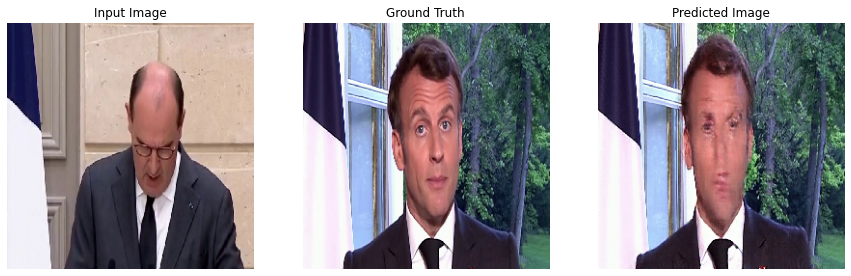

  0%|          | 0/2000 [00:00<?, ?it/s]

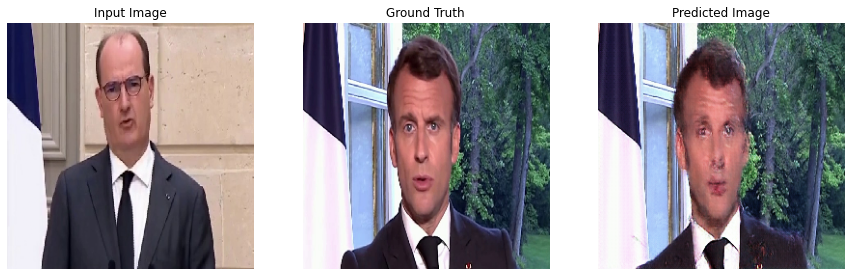

  0%|          | 0/2000 [00:00<?, ?it/s]

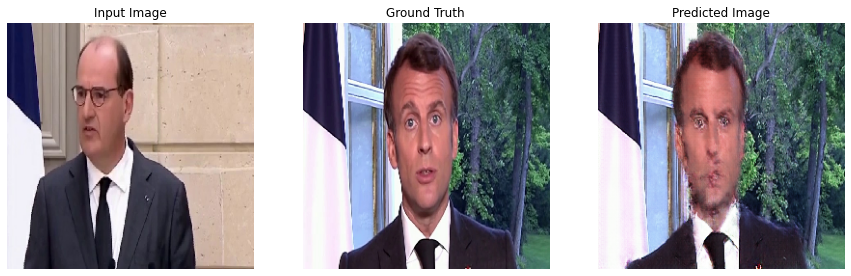

  0%|          | 0/2000 [00:00<?, ?it/s]

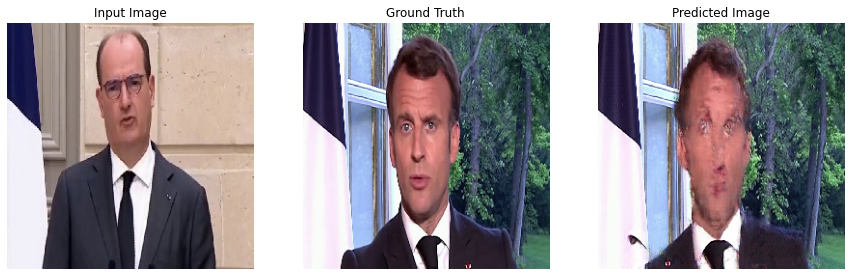

  0%|          | 0/2000 [00:00<?, ?it/s]

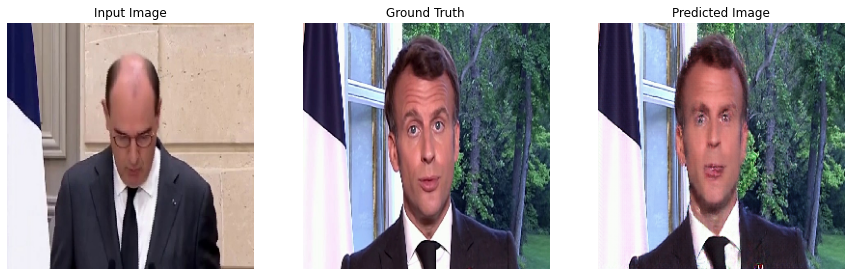

  0%|          | 0/2000 [00:00<?, ?it/s]

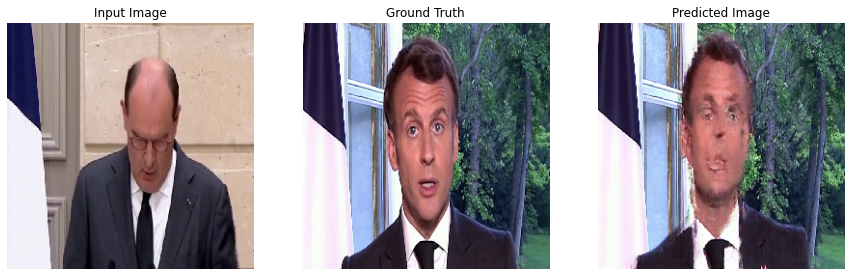

  0%|          | 0/2000 [00:00<?, ?it/s]

In [23]:
#Les images représentent l'avancement de l'entrainement, de gauche à droite nous avons:
#L'image d'arrivé, le résultat attendu, le résultat obtenu, évidemment l'image généré l'ai à partir du jeu de test
#Ces images sont disponibles dans le dossier imgResult
fit(train_ds1=train_dataset1, train_ds2=train_dataset2, epochs=EPOCHS, test_ds1=test_dataset1, test_ds2=test_dataset2)
